# Instalacja oraz import niezbędnych bibliotek

In [1]:
!pip install datashader
!pip install holoviews hvplot colorcet
!pip install geoviews
!pip install pyspark

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 42.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.2/511.2 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 21.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.9/316.9 MB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.5.0-py2.py3-none-any.whl size=317425345 sha256=b135cd993c0a616717b5a439d1b080cce3b18013fdf9fdf13c1d15f5e7f356b2
  Stored in directory: /root/.cache/pip/wheels/41/4e/10/c2cf2467f71c678cfc8a6b9ac9241e5e44a01940da8fbb17fc
Successfully built pyspark


In [2]:
from typing import Optional, Tuple, List

import copy
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import matplotlib as mpl
import pandas as pd
import pickle

import sklearn
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

from imblearn.over_sampling import RandomOverSampler, SMOTE

import datashader as ds
import datashader.transfer_functions as tf
import holoviews as hv
import geoviews as gv
import geoviews.tile_sources as gts
from holoviews.operation.datashader import datashade
from holoviews import opts

from IPython.display import IFrame
from IPython.core.display import display

from bokeh.plotting import show, output_notebook
from bokeh.layouts import row

import pyspark
from pyspark.sql import SparkSession, DataFrame as SparkDataFrame, functions as F, Window
from pyspark.sql.types import IntegerType, FloatType, StringType, StructType

import lightgbm as lgb

In [15]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Funkcje

Funkcje z notatnika Rafała:

In [4]:
class BalanceDataSet():
  '''
  Two techniques for handling imbalanced data.
  '''
  def __init__(
      self,
      X: pd.DataFrame,
      y: pd.DataFrame,
      random_seed: int = 2023
      ) -> None:
      self.X = X
      self.y = y
      assert len(self.X)==len(self.y)
      self.random_seed = random_seed
      self.oversample = RandomOverSampler(sampling_strategy='auto', random_state=random_seed)
      self.smote = SMOTE(random_state=random_seed)

  def useOverSampling(
      self,
      ) -> Tuple[pd.DataFrame, pd.DataFrame]:
    return self.oversample.fit_resample(self.X, self.y)

  def useSMOTE(
      self,
      ) -> Tuple[pd.DataFrame, pd.DataFrame]:
    return self.smote.fit_resample(self.X, self.y)

In [5]:
def summary_model(model: sklearn.base.BaseEstimator, X: pd.DataFrame, y: pd.DataFrame, labels_names: List) -> None:
  y_pred = model.predict(X)
  y_real= y
  cf_matrix = confusion_matrix(y_real, y_pred)
  group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
  group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
  labels = [f"{v1}\n{v2}" for v1, v2 in zip(group_counts,group_percentages)]
  labels = np.asarray(labels).reshape(len(labels_names),len(labels_names))
  sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Reds',xticklabels=labels_names,yticklabels=labels_names)
  plt.xlabel('Predykcja')
  plt.ylabel('Rzeczywistość')
  plt.show()

Funkcja zwracająca cztery metryki oceniające klasyfikator:

In [6]:
def show_metrics(model: sklearn.base.BaseEstimator, X: pd.DataFrame, y: pd.DataFrame) -> None:
  y_pred = model.predict(X)
#  print("Macierz błędu\n", confusion_matrix(y_true, y_pred), "\n")
  accuracy = accuracy_score(y, y_pred)
  print(f"Dokładność (accuracy): {accuracy*100:.2f}%")
  precision = precision_score(y, y_pred)
  print(f"Precyzja (precision): {precision*100:.2f}%")
  recall = recall_score(y, y_pred)
  print(f"Czułość (recall): {recall*100:.2f}%")
  f1 = f1_score(y, y_pred)
  print(f"F1-score: {f1*100:.2f}%")

## Sklonowanie repozytorium i import zawartych w nim funkcji

In [10]:
!git clone https://github.com/PiotrMaciejKowalski/BigData2024Project.git

Cloning into 'BigData2024Project'...
remote: Enumerating objects: 1785, done.
remote: Counting objects: 100% (1131/1131), done.
remote: Compressing objects: 100% (573/573), done.
remote: Total 1785 (delta 733), reused 842 (delta 551), pack-reused 654
Receiving objects: 100% (1785/1785), 66.52 MiB | 5.56 MiB/s, done.
Resolving deltas: 100% (996/996), done.
Updating files: 100% (147/147), done.


In [11]:
!chmod 755 /content/BigData2024Project/src/setup.sh
!/content/BigData2024Project/src/setup.sh

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.0/236.0 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 514.7/514.7 kB 37.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 453.8/453.8 kB 40.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 306.6/306.6 kB 33.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 67.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 76.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.9/468.9 kB 34.9 MB/s eta 0:00:00
  Attempting uninstall: platformdirs
    Found existing installation: platformdirs 4.1.0
    Uninstalling platformdirs-4.1.0:
      Successfully uninstalled platformdirs-4.1.0
  Attempting uninstall: keyring
    Found existing installation: keyring 23.5.0
    Uninstal

In [12]:
import sys
sys.path.append('/content/BigData2024Project/src')

In [13]:
from start_spark import initialize_spark

In [14]:
from big_mess.loaders import default_loader
from agg_classification_eval import overYearMonthStats, plot_comparison, plot_map, show_metrics, prepare_agg_data_for_training

# Załadowanie zbioru danych

In [ ]:
initialize_spark()

In [ ]:
spark = SparkSession.builder\
        .master("local")\
        .appName("Colab")\
        .config('spark.ui.port', '4050')\
        .getOrCreate()

In [ ]:
%%time
nasa = default_loader(spark)
nasa.show(5)

+---------+-------+-----+---------+---------+---------+--------------+----------+---------+----------+---------------+----+-----+
|      lon|    lat|Rainf|     Evap| AvgSurfT|   Albedo|SoilT_40_100cm|      GVEG|  PotEvap| RootMoist|SoilM_100_200cm|Year|Month|
+---------+-------+-----+---------+---------+---------+--------------+----------+---------+----------+---------------+----+-----+
|-112.0625|25.0625|  0.0|   4.3807| 288.0707| 41.47715|     289.00714|0.19712792|139.13737|  243.2525|      108.76931|2000|    1|
|-111.9375|25.0625|  0.0|4.6673994|287.39276|41.509407|      288.8017|0.19860405|162.25638| 220.77466|       90.67495|2000|    1|
|-111.8125|25.0625|  0.0|5.8487973| 287.6554|41.505375|     289.55984|0.17118543|121.55404| 103.95005|      161.94794|2000|    1|
|-111.6875|25.0625|  0.0|6.4366016| 287.5386|41.501343|     289.61142|0.17118543|127.63407|106.032845|      163.44402|2000|    1|
|-111.5625|25.0625|  0.0|3.4506986| 287.2394|41.509407|      289.2371| 0.1429876|179.37668

In [ ]:
nasa.createOrReplaceTempView("nasa")

# Średnie wieloletnie dla poszczególnych miesięcy

Zastosujmy teraz funkcję `overYearMonthStats` na naszym datasecie, dla każdej z rozważanych kolumn pomiarowych, przyjmując $n\in\{3, 4, 5\}$ (tj. średnie 3, 4 i 5-letnie). Następnie wyodrębnijmy do oddzielnych dataframe'ów lata $2000$, $2020$, $2022$ oraz $2023$.

In [ ]:
columns_to_avg = ["Rainf", "Evap", "AvgSurfT", "Albedo", "SoilT_40_100cm", "GVEG", "PotEvap", "RootMoist", "SoilM_100_200cm"]

In [ ]:
for n in [3, 4, 5]:
    result_df = overYearMonthStats(nasa, columns_to_avg, n=n)
    for year in [2023, 2022, 2020, 2000]:
        filtered_data = result_df.filter(f'Year = {year}')
        pd_monthly_avg = filtered_data.toPandas()
        pd_monthly_avg.to_csv(f'/content/drive/MyDrive/BigMess/NASA/monthly_avg/{n}years/NASA_monthly_avg_{year}.csv')

# Dane do modeli

Z wyodrębnionych zbiorów danych weźmiemy pomiary z lipca 2023, ponieważ na takich trenowane były pierwotne modele. Po zmerge'owaniu ze zbiorem anotowanym, pozostawiamy tylko kolumny ze współrzędnymi, ze średnimi oraz kolumnę 'pustynia' ograniczając się jedynie do stwierdzenia czy dana lokalizacja jest pustynią czy nie.

Zaimportujmy zbiór anotowany:

In [29]:
NASA_sample_an = pd.read_csv('/content/drive/MyDrive/BigMess/NASA/NASA_an.csv', sep=';')

Wyodrębnijmy pożądane dane z uśrednionych zbiorów przy użyciu funkcji `prepare_agg_data_for_training`:

In [ ]:
monthly_avg_3_july2023, monthly_avg_3_july2023_an_merge = prepare_agg_data_for_training(nasa_sample_an=NASA_sample_an, year=2023, month=7, n_years=3)
monthly_avg_4_july2023, monthly_avg_4_july2023_an_merge = prepare_agg_data_for_training(nasa_sample_an=NASA_sample_an, year=2023, month=7, n_years=4)
monthly_avg_5_july2023, monthly_avg_5_july2023_an_merge = prepare_agg_data_for_training(nasa_sample_an=NASA_sample_an, year=2023, month=7, n_years=5)

## Porównanie na wykresach

Porównamy na wykresach słupkowych wartości rozważanych przez nas zmiennych, w każdym z uśrednionych zbiorów, dla 10 losowo wybranych lokalizacji:

In [39]:
var_list = ['Rainf', 'Evap', 'AvgSurfT', 'Albedo', 'SoilT_40_100cm', 'GVEG', 'PotEvap', 'RootMoist', 'SoilM_100_200cm']
dfs_to_compare = [monthly_avg_3_july2023_an_merge, monthly_avg_4_july2023_an_merge, monthly_avg_5_july2023_an_merge]

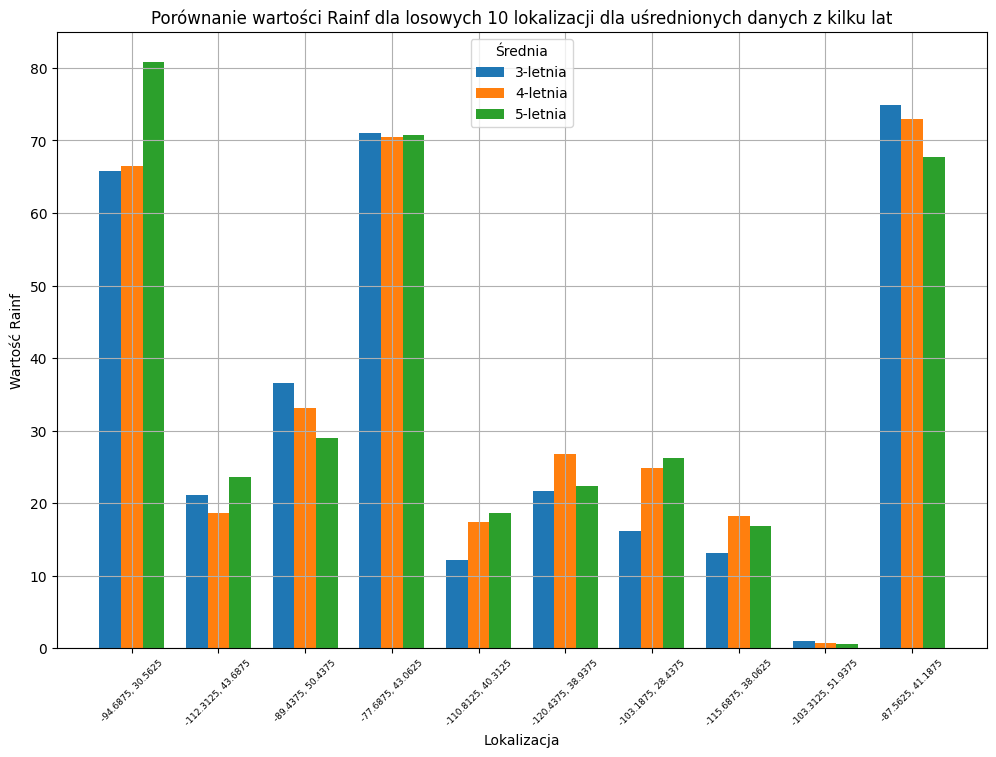

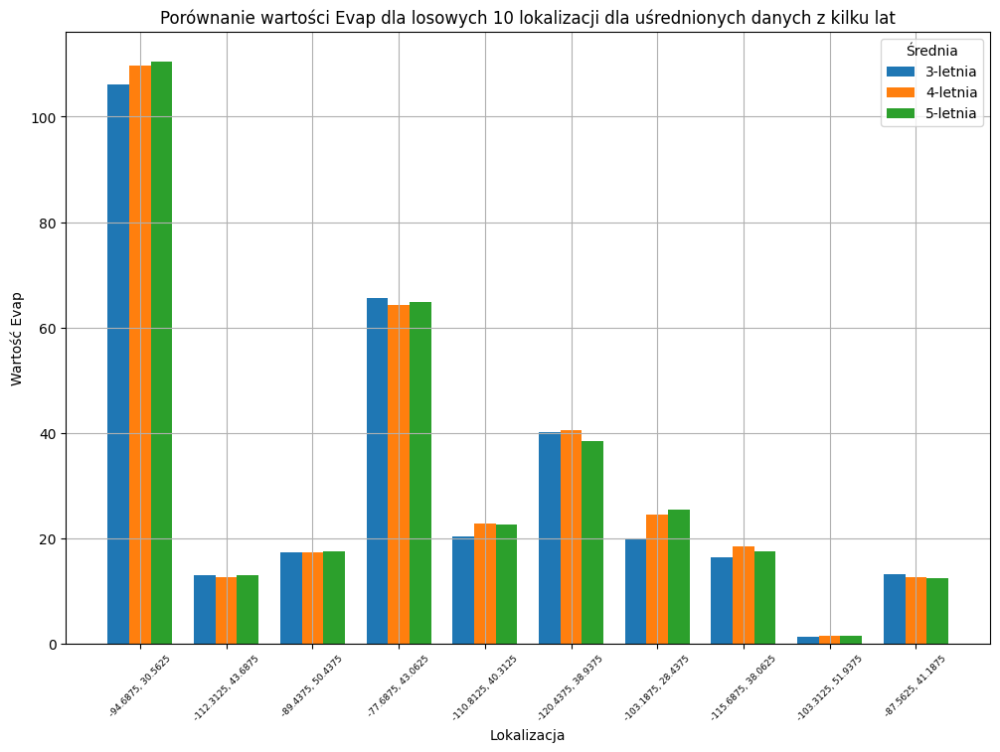

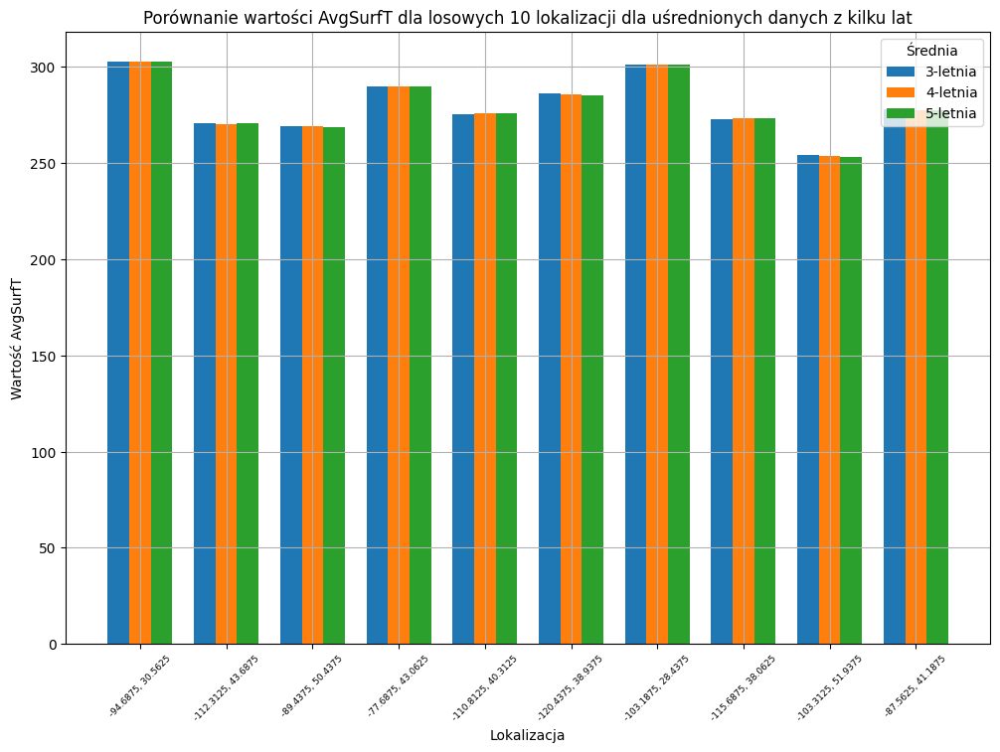

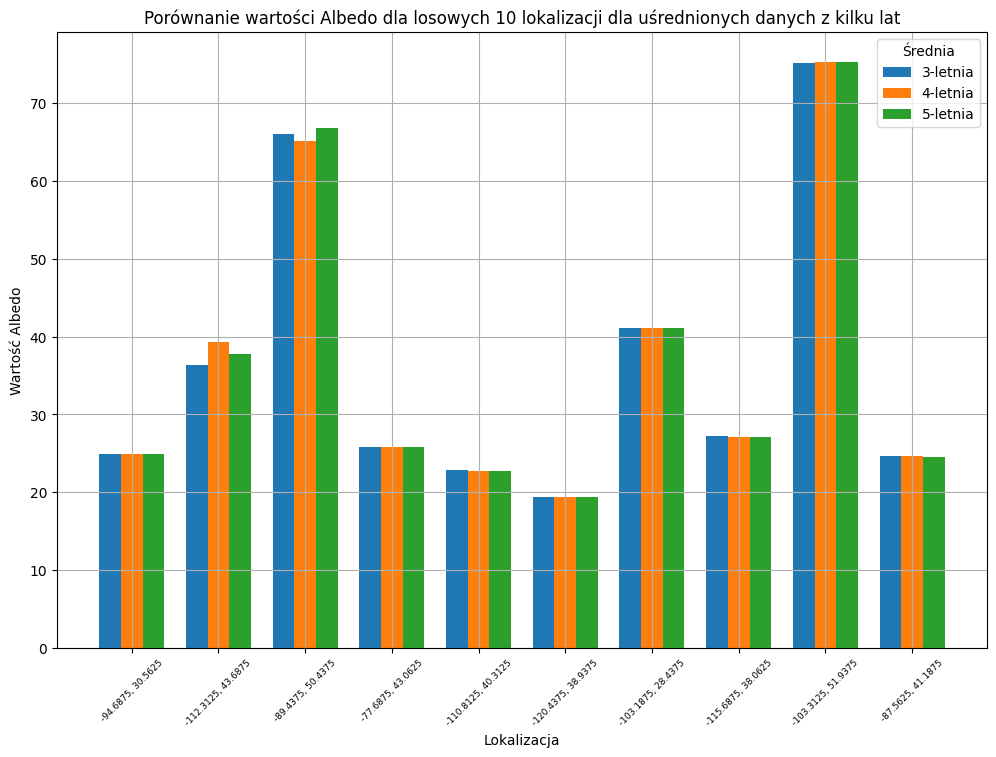

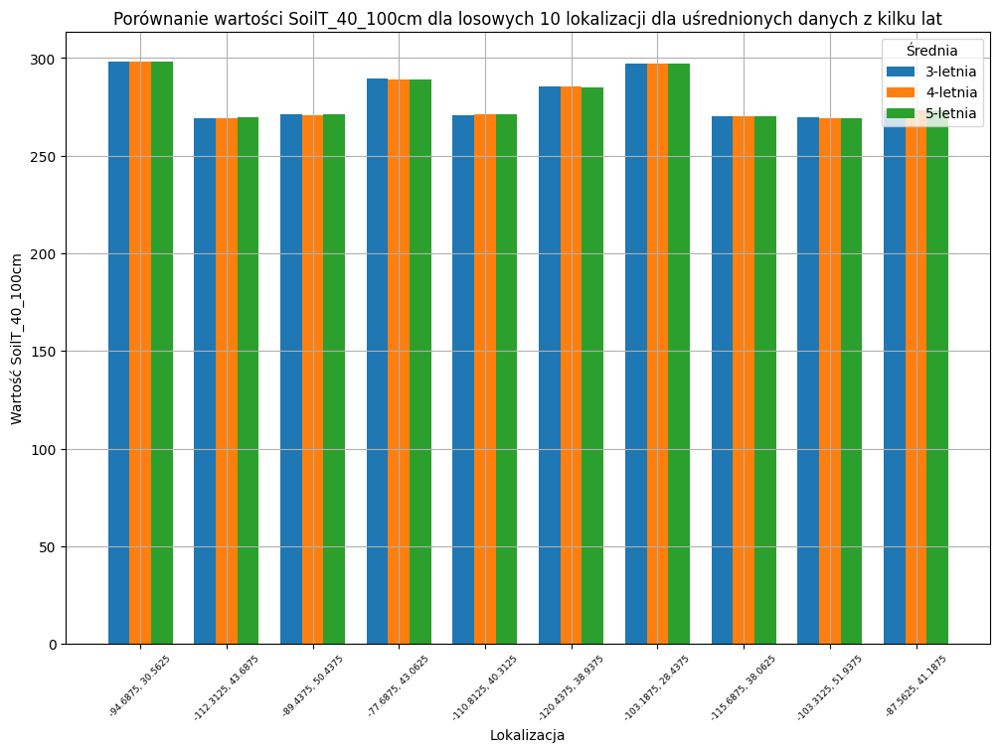

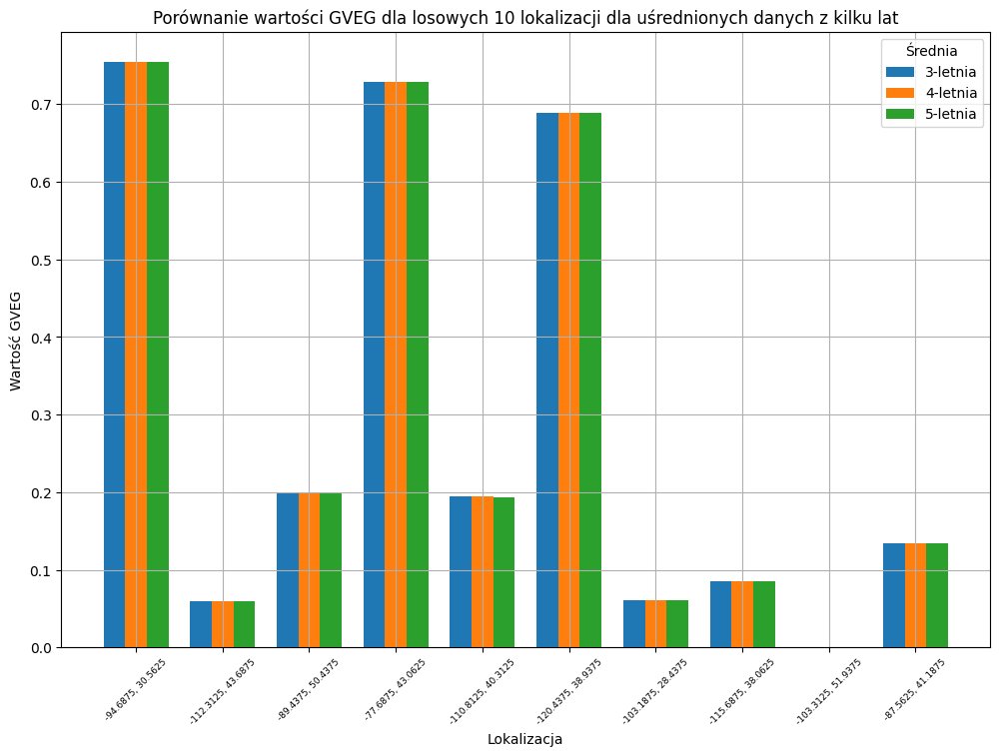

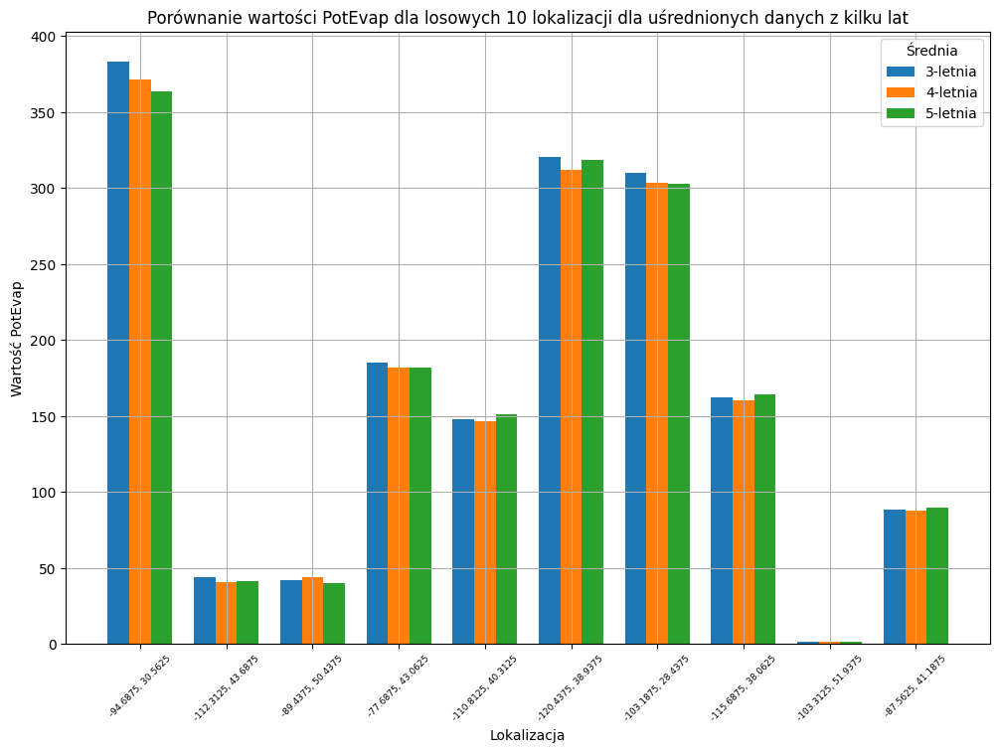

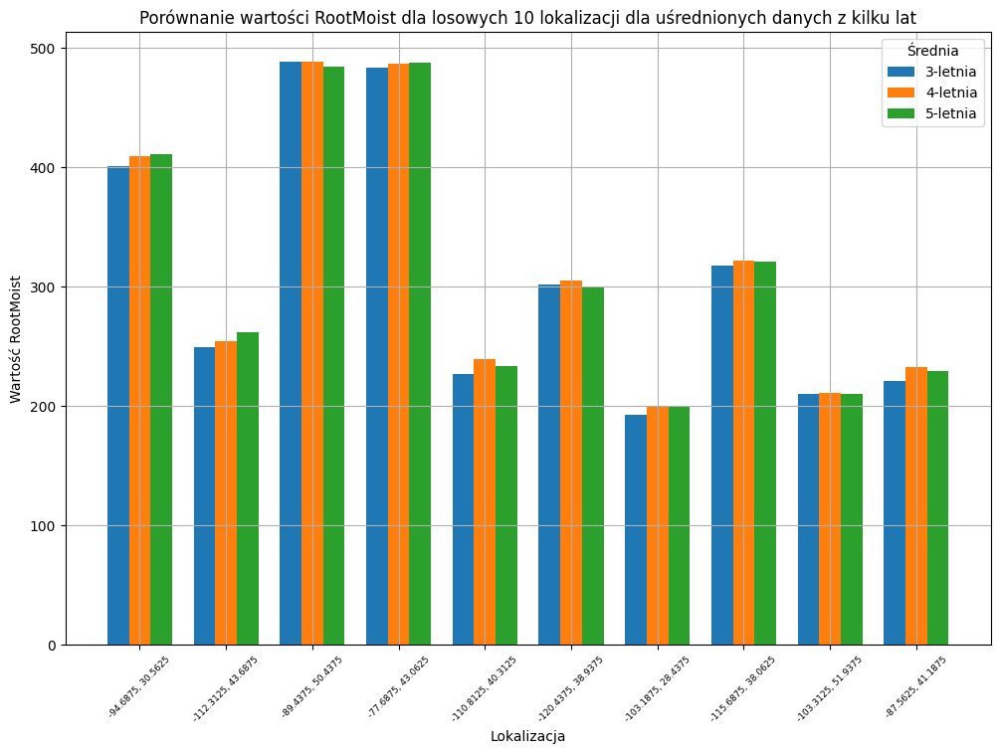

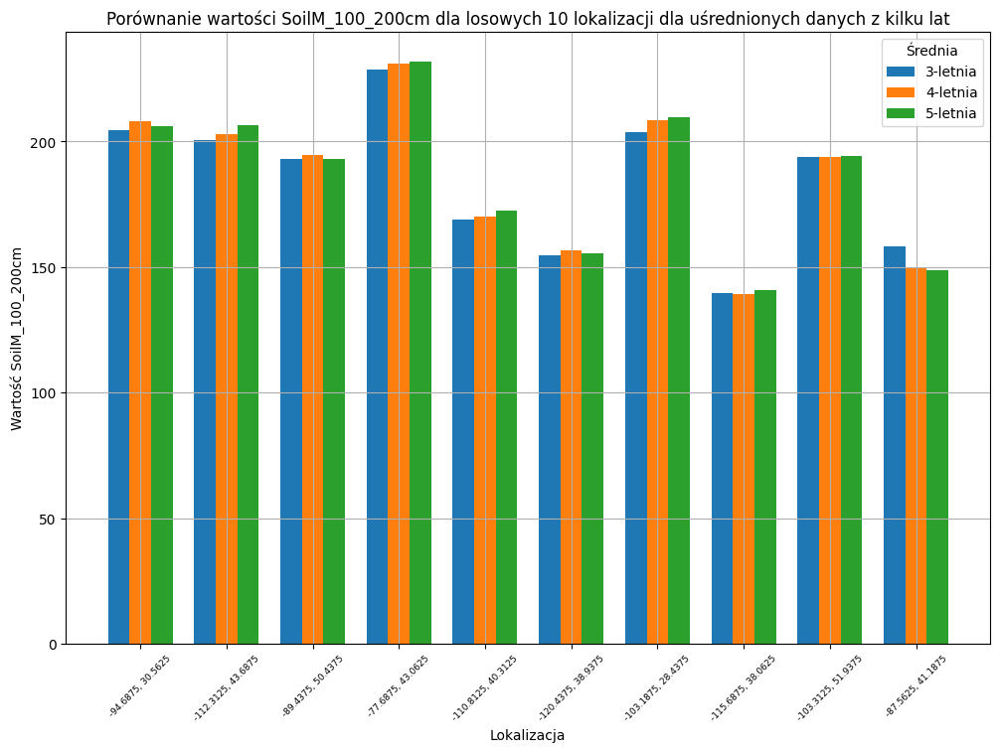

In [ ]:
for var in var_list:
  plot_comparison(dfs_to_compare, var)
  print()

Najbardziej zauważalne różnice między zbiorami można dostrzec w przypadku zmiennej Rainf, reszta wydaje się przyjmować nieco bardziej stabilne wartości średnich kilkuletnich.

# Las losowy

## Trening i test modelu przy użyciu nowych danych i zbioru anotowanego

In [47]:
best_rf = RandomForestClassifier(max_depth=8, min_samples_leaf=4, n_estimators=70, random_state=3)

### Średnie 3-letnie

In [ ]:
X = monthly_avg_3_july2023_an_merge.drop(columns=['lon', 'lat', 'pustynia'])
y = monthly_avg_3_july2023_an_merge['pustynia']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2023)

In [ ]:
rf_monthly_avg_3_july2023 = best_rf.copy()
rf_monthly_avg_3_july2023.fit(X_train, y_train)

RandomForestClassifier(max_depth=8, min_samples_leaf=4, n_estimators=70,
                       random_state=3)

Zastosujmy model na pełnych danych:

In [ ]:
monthly_avg_3_july2023_pred = monthly_avg_3_july2023.copy()
monthly_avg_3_july2023_pred['pustynia'] = rf_monthly_avg_3_july2023.predict(
    monthly_avg_3_july2023.loc[:, [col for col in monthly_avg_3_july2023.columns if col.startswith('monthly_avg')]])

In [ ]:
output_notebook()
show(plot_map(df=monthly_avg_3_july2023_pred, parameter_name='pustynia',
              colormap=dict(zip(['1', '0'], ['yellow', 'green'])),
              title='Pustynie (1) i niepustynie (0) - las losowy (lipiec 2023, średnia 3-letnia)',
              point_size=3, alpha=0.7))

##### Ocena na zbiorze treningowym

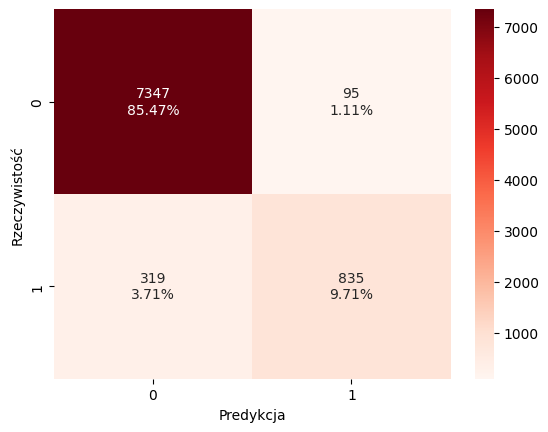

In [ ]:
summary_model(rf_monthly_avg_3_july2023, X_train, y_train, ['0','1'])

In [ ]:
show_metrics(rf_monthly_avg_3_july2023, X_train, y_train)

Dokładność (accuracy): 95.18%
Precyzja (precision): 89.78%
Czułość (recall): 72.36%
F1-score: 80.13%


##### Ocena na zbiorze testowym

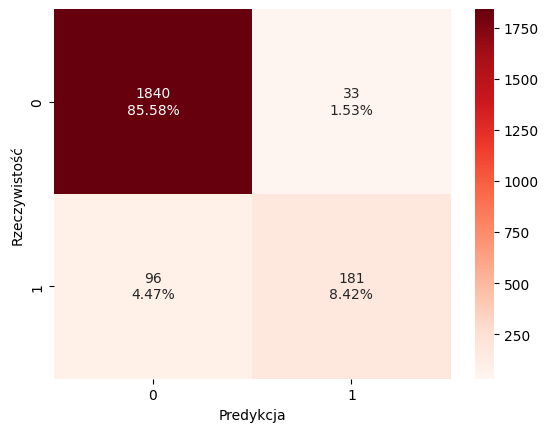

In [ ]:
summary_model(rf_monthly_avg_3_july2023, X_test, y_test, ['0', '1'])

In [ ]:
show_metrics(rf_monthly_avg_3_july2023, X_test, y_test)

Dokładność (accuracy): 94.00%
Precyzja (precision): 84.58%
Czułość (recall): 65.34%
F1-score: 73.73%


##### Próba treningu na zbalansowanym datasecie

In [ ]:
X_train_bal, y_train_bal = BalanceDataSet(X_train, y_train).useSMOTE()

In [ ]:
rf_monthly_avg_3_july2023_bal = best_rf.copy()
rf_monthly_avg_3_july2023_bal.fit(X_train_bal, y_train_bal)

RandomForestClassifier(max_depth=8, min_samples_leaf=4, n_estimators=70,
                       random_state=3)

In [ ]:
show_metrics(rf_monthly_avg_3_july2023_bal, X_train_bal, y_train_bal)

Dokładność (accuracy): 94.47%
Precyzja (precision): 91.36%
Czułość (recall): 98.23%
F1-score: 94.67%


In [ ]:
show_metrics(rf_monthly_avg_3_july2023_bal, X_test, y_test)

Dokładność (accuracy): 89.86%
Precyzja (precision): 56.48%
Czułość (recall): 92.78%
F1-score: 70.22%


W tym wypadku model gorzej radzi sobie na zbiorze testowym.

### Średnie 4-letnie

In [ ]:
X = monthly_avg_4_july2023_an_merge.drop(columns=['lon', 'lat', 'pustynia'])
y = monthly_avg_4_july2023_an_merge['pustynia']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2023)

In [ ]:
rf_monthly_avg_4_july2023 = best_rf.copy()
rf_monthly_avg_4_july2023.fit(X_train, y_train)

RandomForestClassifier(max_depth=8, min_samples_leaf=4, n_estimators=70,
                       random_state=3)

Zastosujmy model na pełnych danych:

In [ ]:
monthly_avg_4_july2023_pred = monthly_avg_4_july2023.copy()
monthly_avg_4_july2023_pred['pustynia'] = rf_monthly_avg_4_july2023.predict(monthly_avg_4_july2023.loc[:, [col for col in monthly_avg_4_july2023.columns if col.startswith('monthly_avg')]])

In [ ]:
output_notebook()
show(plot_map(df=monthly_avg_4_july2023_pred, parameter_name='pustynia',
              colormap=dict(zip(['1', '0'], ['yellow', 'green'])),
              title='Pustynie (1) i niepustynie (0) - las losowy (lipiec 2023, średnia 4-letnia)',
              point_size=3, alpha=0.7))

##### Ocena na zbiorze treningowym

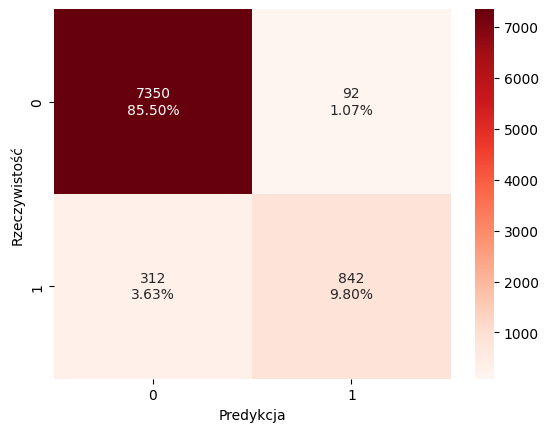

In [ ]:
summary_model(rf_monthly_avg_4_july2023, X_train, y_train, ['0','1'])

In [ ]:
show_metrics(rf_monthly_avg_4_july2023, X_train, y_train)

Dokładność (accuracy): 95.30%
Precyzja (precision): 90.15%
Czułość (recall): 72.96%
F1-score: 80.65%


##### Ocena na zbiorze testowym

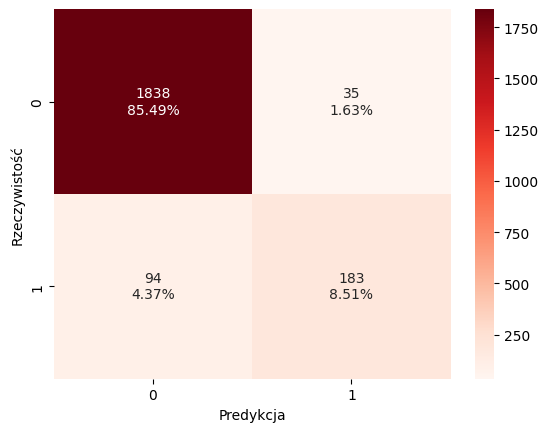

In [ ]:
summary_model(rf_monthly_avg_4_july2023, X_test, y_test, ['0', '1'])

In [ ]:
show_metrics(rf_monthly_avg_4_july2023, X_test, y_test)

Dokładność (accuracy): 94.00%
Precyzja (precision): 83.94%
Czułość (recall): 66.06%
F1-score: 73.94%


### Średnie 5-letnie

In [ ]:
X = monthly_avg_5_july2023_an_merge.drop(columns=['lon', 'lat', 'pustynia'])
y = monthly_avg_5_july2023_an_merge['pustynia']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2023)

In [ ]:
rf_monthly_avg_5_july2023 = best_rf.copy()
rf_monthly_avg_5_july2023.fit(X_train, y_train)

RandomForestClassifier(max_depth=8, min_samples_leaf=4, n_estimators=70,
                       random_state=3)

Zastosujmy model na pełnych danych:

In [ ]:
monthly_avg_5_july2023_pred = monthly_avg_5_july2023.copy()
monthly_avg_5_july2023_pred['pustynia'] = rf_monthly_avg_5_july2023.predict(monthly_avg_5_july2023.loc[:, [col for col in monthly_avg_5_july2023.columns if col.startswith('monthly_avg')]])

In [ ]:
output_notebook()
show(plot_map(df=monthly_avg_5_july2023_pred, parameter_name='pustynia',
              colormap=dict(zip(['1', '0'], ['yellow', 'green'])),
              title='Pustynie (1) i niepustynie (0) - las losowy (lipiec 2023, średnia 5-letnia)',
              point_size=3, alpha=0.7))

##### Ocena na zbiorze treningowym

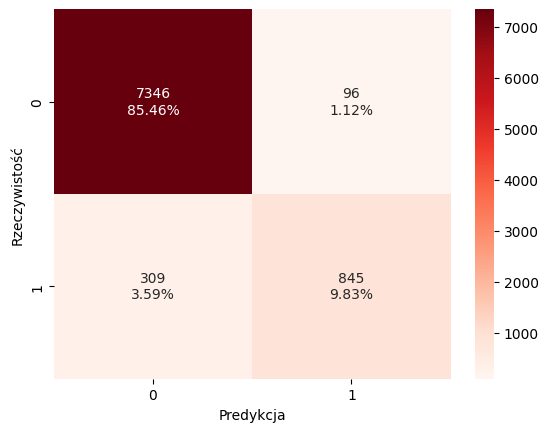

In [ ]:
summary_model(rf_monthly_avg_5_july2023, X_train, y_train, ['0','1'])

In [ ]:
show_metrics(rf_monthly_avg_5_july2023, X_train, y_train)

Dokładność (accuracy): 95.29%
Precyzja (precision): 89.80%
Czułość (recall): 73.22%
F1-score: 80.67%


##### Ocena na zbiorze testowym

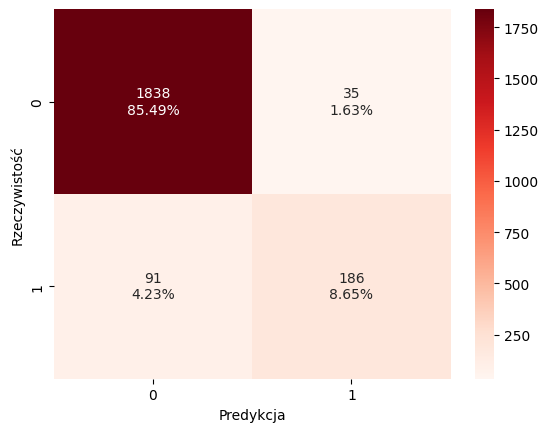

In [ ]:
summary_model(rf_monthly_avg_5_july2023, X_test, y_test, ['0', '1'])

In [ ]:
show_metrics(rf_monthly_avg_5_july2023, X_test, y_test)

Dokładność (accuracy): 94.14%
Precyzja (precision): 84.16%
Czułość (recall): 67.15%
F1-score: 74.70%


## Wnioski

Wszystkie trzy modele na zbiorze testowym wypadają niemalże identycznie. Gdyby już musieć wybrać najlepszy model to byłby to model wytrenowany na 5-letnich średnich dla miesięcy, ale występujące w metrykach klasyfikacji różnice są zupełnie nieznaczne.

### Zapisanie najlepszego modelu

In [ ]:
import pickle
best_rf_path='/content/drive/MyDrive/BigMess/NASA/Modele/Klasyfikacja/Modele_kilkuletnia_agregacja/random_forest_5years_avg_july2023'
with open(best_rf_path, 'wb') as files:
  pickle.dump(rf_monthly_avg_5_july2023, files)

# LGBM

## Trening i test modelu przy użyciu nowych danych i zbioru anotowanego

In [ ]:
best_lgbm = lgb.LGBMClassifier(max_depth=10, n_estimators=120, num_leaves=30, random_state=3)

### Średnie 3-letnie

In [ ]:
X = monthly_avg_3_july2023_an_merge.drop(columns=['lon', 'lat', 'pustynia'])
y = monthly_avg_3_july2023_an_merge['pustynia']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2023)

In [ ]:
lgbm_monthly_avg_3_july2023 = best_lgbm.copy()
lgbm_monthly_avg_3_july2023.fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 1154, number of negative: 7442
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 8596, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.134248 -> initscore=-1.863905
[LightGBM] [Info] Start training from score -1.863905


LGBMClassifier(max_depth=10, n_estimators=120, num_leaves=30, random_state=3)

Zastosujmy model na pełnych danych:

In [ ]:
monthly_avg_3_july2023_pred_lgbm = monthly_avg_3_july2023.copy()
monthly_avg_3_july2023_pred_lgbm['pustynia'] = lgbm_monthly_avg_3_july2023.predict(monthly_avg_3_july2023.loc[:, [col for col in monthly_avg_3_july2023.columns if col.startswith('monthly_avg')]])

In [ ]:
output_notebook()
show(plot_map(df=monthly_avg_3_july2023_pred_lgbm, parameter_name='pustynia',
              colormap=dict(zip(['1', '0'], ['yellow', 'green'])),
              title='Pustynie (1) i niepustynie (0) - LGBM (lipiec 2023, średnia 3-letnia)',
              point_size=3, alpha=0.7))

##### Ocena na zbiorze treningowym

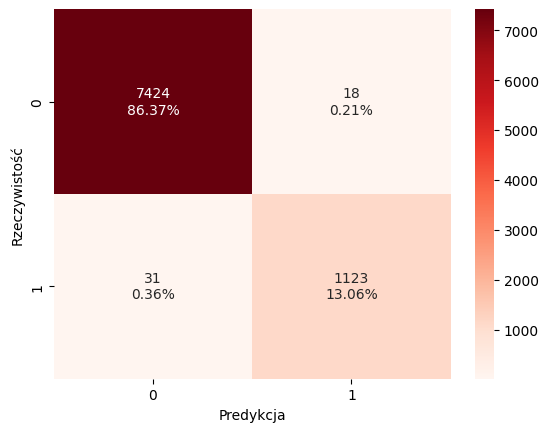

In [ ]:
summary_model(lgbm_monthly_avg_3_july2023, X_train, y_train, ['0','1'])

In [ ]:
show_metrics(lgbm_monthly_avg_3_july2023, X_train, y_train)

Dokładność (accuracy): 99.43%
Precyzja (precision): 98.42%
Czułość (recall): 97.31%
F1-score: 97.86%


##### Ocena na zbiorze testowym

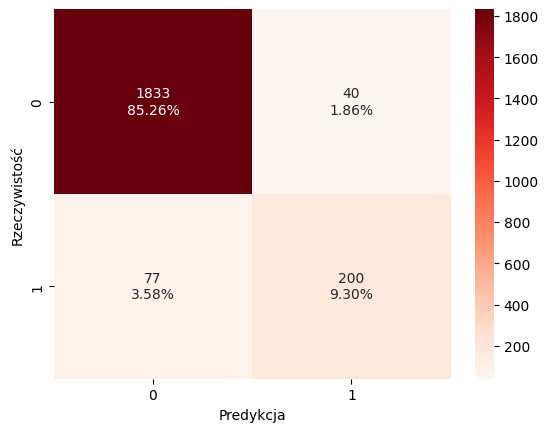

In [ ]:
summary_model(lgbm_monthly_avg_3_july2023, X_test, y_test, ['0', '1'])

In [ ]:
show_metrics(lgbm_monthly_avg_3_july2023, X_test, y_test)

Dokładność (accuracy): 94.56%
Precyzja (precision): 83.33%
Czułość (recall): 72.20%
F1-score: 77.37%


##### Próba treningu na zbalansowanym datasecie

In [ ]:
X_train_bal, y_train_bal = BalanceDataSet(X_train, y_train).useSMOTE()

In [ ]:
lgbm_monthly_avg_3_july2023_bal = best_lgbm.copy()
lgbm_monthly_avg_3_july2023_bal.fit(X_train_bal, y_train_bal)

[LightGBM] [Info] Number of positive: 7442, number of negative: 7442
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 14884, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


LGBMClassifier(max_depth=10, n_estimators=120, num_leaves=30, random_state=3)

In [ ]:
show_metrics(lgbm_monthly_avg_3_july2023_bal, X_train_bal, y_train_bal)

Dokładność (accuracy): 98.11%
Precyzja (precision): 96.69%
Czułość (recall): 99.62%
F1-score: 98.13%


In [ ]:
show_metrics(lgbm_monthly_avg_3_july2023_bal, X_test, y_test)

Dokładność (accuracy): 92.60%
Precyzja (precision): 65.21%
Czułość (recall): 91.34%
F1-score: 76.09%


W tym wypadku model gorzej radzi sobie na zbiorze testowym.

### Średnie 4-letnie

In [ ]:
X = monthly_avg_4_july2023_an_merge.drop(columns=['lon', 'lat', 'pustynia'])
y = monthly_avg_4_july2023_an_merge['pustynia']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2023)

In [ ]:
lgbm_monthly_avg_4_july2023 = best_lgbm.copy()
lgbm_monthly_avg_4_july2023.fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 1154, number of negative: 7442
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 8596, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.134248 -> initscore=-1.863905
[LightGBM] [Info] Start training from score -1.863905


LGBMClassifier(max_depth=10, n_estimators=120, num_leaves=30, random_state=3)

Zastosujmy model na pełnych danych:

In [ ]:
monthly_avg_4_july2023_pred_lgbm = monthly_avg_4_july2023.copy()
monthly_avg_4_july2023_pred_lgbm['pustynia'] = lgbm_monthly_avg_4_july2023.predict(monthly_avg_4_july2023.loc[:, [col for col in monthly_avg_4_july2023.columns if col.startswith('monthly_avg')]])

In [ ]:
output_notebook()
show(plot_map(df=monthly_avg_4_july2023_pred_lgbm, parameter_name='pustynia',
              colormap=dict(zip(['1', '0'], ['yellow', 'green'])),
              title='Pustynie (1) i niepustynie (0) - LGBM (lipiec 2023, średnia 4-letnia)',
              point_size=3, alpha=0.7))

##### Ocena na zbiorze treningowym

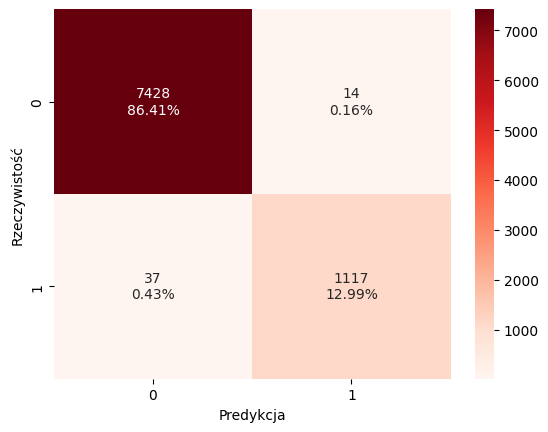

In [ ]:
summary_model(lgbm_monthly_avg_4_july2023, X_train, y_train, ['0','1'])

In [ ]:
show_metrics(lgbm_monthly_avg_4_july2023, X_train, y_train)

Dokładność (accuracy): 99.41%
Precyzja (precision): 98.76%
Czułość (recall): 96.79%
F1-score: 97.77%


##### Ocena na zbiorze testowym

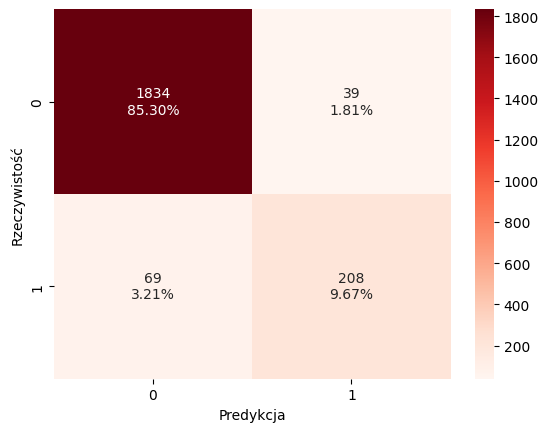

In [ ]:
summary_model(lgbm_monthly_avg_4_july2023, X_test, y_test, ['0', '1'])

In [ ]:
show_metrics(lgbm_monthly_avg_4_july2023, X_test, y_test)

Dokładność (accuracy): 94.98%
Precyzja (precision): 84.21%
Czułość (recall): 75.09%
F1-score: 79.39%


### Średnie 5-letnie

In [ ]:
X = monthly_avg_5_july2023_an_merge.drop(columns=['lon', 'lat', 'pustynia'])
y = monthly_avg_5_july2023_an_merge['pustynia']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2023)

In [ ]:
lgbm_monthly_avg_5_july2023 = best_lgbm.copy()
lgbm_monthly_avg_5_july2023.fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 1154, number of negative: 7442
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 8596, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.134248 -> initscore=-1.863905
[LightGBM] [Info] Start training from score -1.863905


LGBMClassifier(max_depth=10, n_estimators=120, num_leaves=30, random_state=3)

Zastosujmy model na pełnych danych:

In [ ]:
monthly_avg_5_july2023_pred_lgbm = monthly_avg_5_july2023.copy()
monthly_avg_5_july2023_pred_lgbm['pustynia'] = lgbm_monthly_avg_5_july2023.predict(monthly_avg_5_july2023.loc[:, [col for col in monthly_avg_5_july2023.columns if col.startswith('monthly_avg')]])

In [ ]:
output_notebook()
show(plot_map(df=monthly_avg_5_july2023_pred_lgbm, parameter_name='pustynia',
              colormap=dict(zip(['1', '0'], ['yellow', 'green'])),
              title='Pustynie (1) i niepustynie (0) - LGBM (lipiec 2023, średnia 5-letnia)',
              point_size=3, alpha=0.7))

##### Ocena na zbiorze treningowym

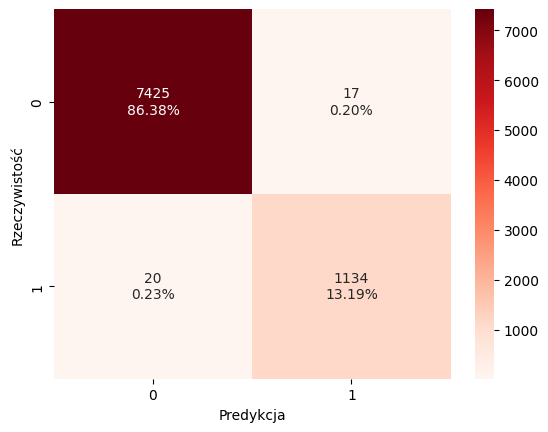

In [ ]:
summary_model(lgbm_monthly_avg_5_july2023, X_train, y_train, ['0','1'])

In [ ]:
show_metrics(lgbm_monthly_avg_5_july2023, X_train, y_train)

Dokładność (accuracy): 99.57%
Precyzja (precision): 98.52%
Czułość (recall): 98.27%
F1-score: 98.39%


##### Ocena na zbiorze testowym

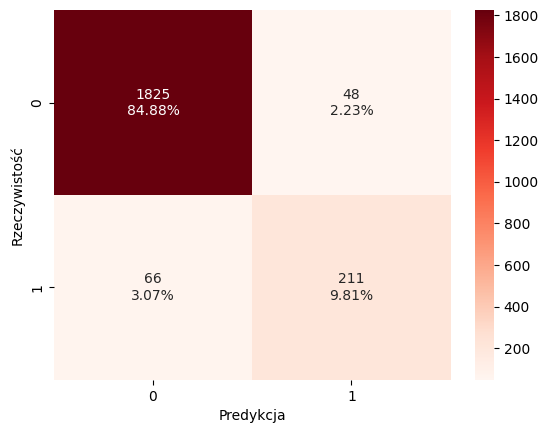

In [ ]:
summary_model(lgbm_monthly_avg_5_july2023, X_test, y_test, ['0', '1'])

In [ ]:
show_metrics(lgbm_monthly_avg_5_july2023, X_test, y_test)

Dokładność (accuracy): 94.70%
Precyzja (precision): 81.47%
Czułość (recall): 76.17%
F1-score: 78.73%


## Wnioski

Otrzymane modele są lepsze niż wytrenowane wcześniej lasy losowe. Zarówno dla danych treningowych, jak i testowych otrzymujemy lepsze wyniki. Ogólnie, wszystkie trzy modele na zbiorze testowym wypadają bardzo podobnie do siebie. Model wytrenowany na 5-letnich średnich dla miesięcy wydaje się być najmniej precyzyjny, w tym wypadku najlepszy wynik mamy dla 4-letnich średnich. Podsumowując wszystkie metryki klasyfikacji, najlepszym modelem jest model ze średnimi 4-letnimi.

### Zapisanie najlepszego modelu

In [ ]:
import pickle
best_lgbm_path='/content/drive/MyDrive/BigMess/NASA/Modele/Klasyfikacja/Modele_kilkuletnia_agregacja/lgbm_4years_avg_july2023'
with open(best_lgbm_path, 'wb') as files:
  pickle.dump(lgbm_monthly_avg_4_july2023, files)